<a href="https://colab.research.google.com/github/Madhavi-Bijwe/ML/blob/main/License_Plate_Detection_YOLOv10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 Step 01: Clone the YOLOv10 Github Repo

In [44]:
!pip uninstall -y ultralytics
!pip install ultralytics==8.3.0  # latest stable with YOLOv10 support



Found existing installation: ultralytics 8.1.34
Uninstalling ultralytics-8.1.34:
  Successfully uninstalled ultralytics-8.1.34
  Using cached ultralytics-8.3.0-py3-none-any.whl.metadata (34 kB)
Using cached ultralytics-8.3.0-py3-none-any.whl (881 kB)


In [38]:
!git clone https://github.com/THU-MIG/yolov10.git
%cd yolov10

Cloning into 'yolov10'...
remote: Enumerating objects: 20338, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 20338 (delta 2), reused 0 (delta 0), pack-reused 20334 (from 2)
Receiving objects: 100% (20338/20338), 11.10 MiB | 15.04 MiB/s, done.
Resolving deltas: 100% (14354/14354), done.
/content/yolov10/yolov10


Step 02: Install All the Requried Packages

In [39]:
!pip install -q .

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


Step 03: Download the Pretrained Model Weights

In [40]:
import os
import urllib.request
#Create a directory for the weights in the current working directory
weights_dir = os.path.join(os.getcwd(), 'weights')
os.makedirs(weights_dir, exist_ok = True)
#urls of the weights file
urls = ["https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt"]

#Download each file
for url in urls:
  filename = os.path.basename(url)
  filepath = os.path.join(weights_dir, filename)
  urllib.request.urlretrieve(url, filepath)
  print(f"Downloaded: {filepath}")


Downloaded: /content/yolov10/yolov10/weights/yolov10n.pt
Downloaded: /content/yolov10/yolov10/weights/yolov10s.pt
Downloaded: /content/yolov10/yolov10/weights/yolov10m.pt
Downloaded: /content/yolov10/yolov10/weights/yolov10b.pt
Downloaded: /content/yolov10/yolov10/weights/yolov10l.pt
Downloaded: /content/yolov10/yolov10/weights/yolov10x.pt



Step 04: Download the Dataset from Roboflow

In [41]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ZF2DUx6bHDn9xQHjY8RH")
project = rf.workspace("aico").project("license-plate-recognition-bda0n")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to license-plate-recognition-1 in yolov8:: 100%|██████████| 2482/2482 [00:00<00:00, 7625.38it/s]


In [42]:
%cd '/content/yolov10'

/content/yolov10


Step 05: Train Custom Model

In [2]:
!yolo task=detect \
mode=train \
model='weights/yolov10n.pt' \
data='/content/yolov10/license-plate-recognition-1/data.yaml' \
epochs=100 \
batch=16 \
imgsz=640 \
plots=True


New https://pypi.org/project/ultralytics/8.3.223 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.0 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=weights/yolov10n.pt, data=/content/yolov10/license-plate-recognition-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fals

In [ ]:
import os

for root, dirs, files in os.walk('/content', topdown=True):
    for name in files:
        if name == "data.yaml":
            print(os.path.join(root, name))


/content/yolov10/license-plate-recognition-1/data.yaml


Step 06: Examine Training Results

In [4]:
!ls /content/runs


detect


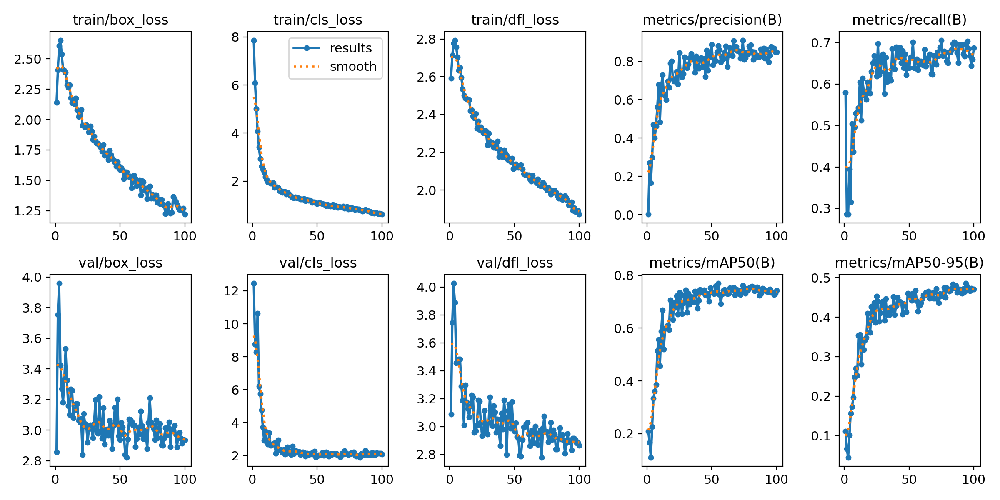

In [10]:
from IPython.display import Image, display

display(Image('/content/runs/detect/train2/results.png'))


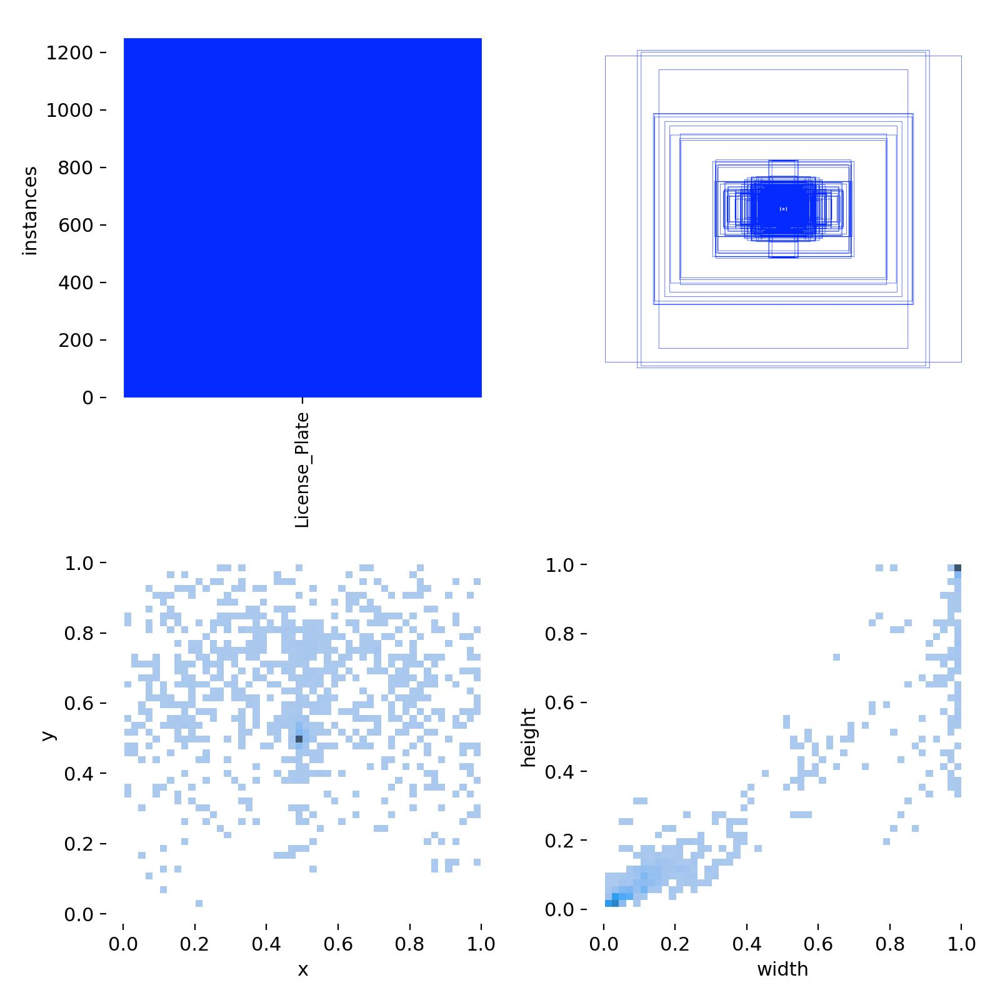

In [6]:
display(Image('/content/runs/detect/train/labels.jpg'))


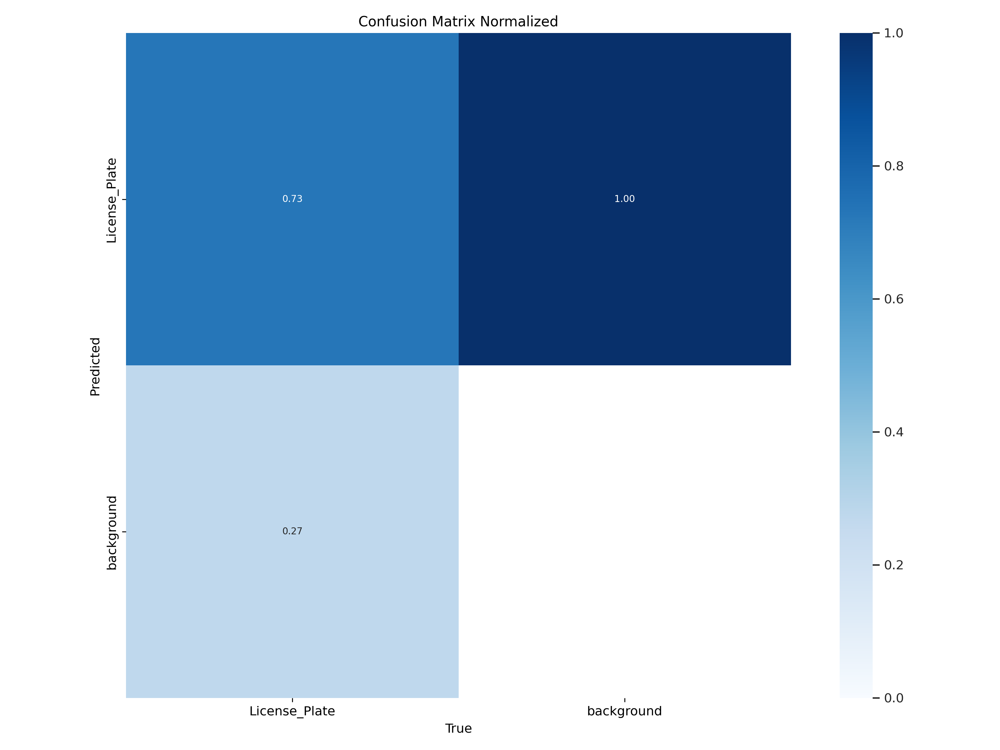

In [9]:
display(Image('/content/runs/detect/train2/confusion_matrix_normalized.png'))



In [17]:
!ls /content
!ls /content/runs/detect



runs  sample_data  wandb  weights  yolov10  yolov8n.pt
train  train2


In [37]:
results = model('/content/carImage1.png', save=True)
# from ultralytics import YOLO
# model = YOLO('/content/drive/MyDrive/best.pt')



image 1/1 /content/carImage1.png: 384x640 2 License_Plates, 55.9ms
Speed: 3.7ms preprocess, 55.9ms inference, 26.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict4


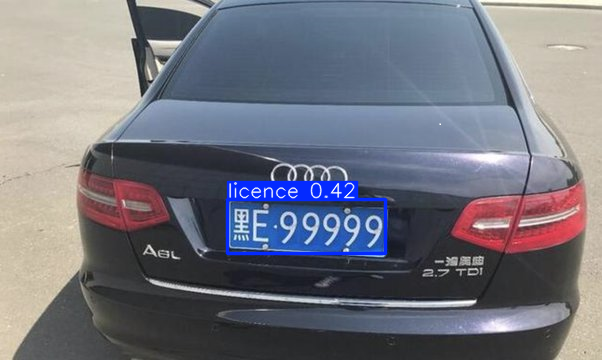

In [38]:
from IPython.display import Image, display
display(Image('/content/runs/detect/predict/carImage1.png'))


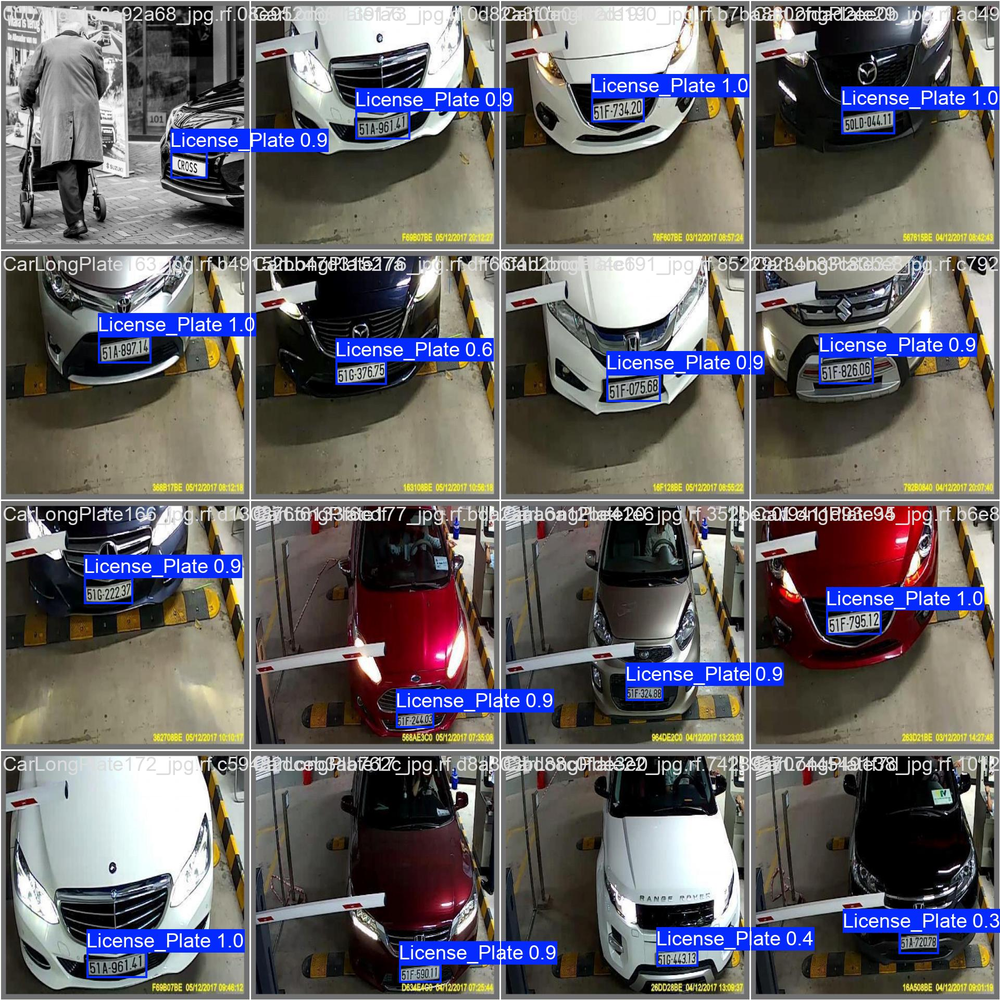

In [15]:
from IPython.display import Image, display
display(Image('/content/runs/detect/train2/val_batch0_pred.jpg'))



# Step 07: Download the Model Weights from Drive

In [18]:

!gdown "https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t
To: /content/best.pt
100% 5.77M/5.77M [00:00<00:00, 22.9MB/s]



# Step 08: Inference on Image

In [19]:
!gdown "https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t
To: /content/carImage1.png
100% 358k/358k [00:00<00:00, 110MB/s]


In [20]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='carImage1.png'


Ultralytics 8.3.0 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/carImage1.png: 384x640 1 licence, 84.6ms
Speed: 5.9ms preprocess, 84.6ms inference, 34.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


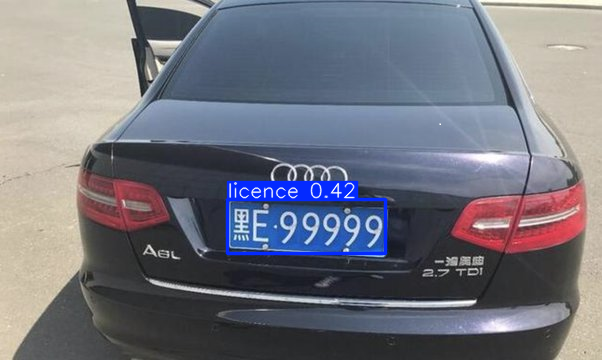

In [40]:
from IPython.display import Image
Image(filename='runs/detect/predict/carImage1.png')


In [22]:
!gdown "https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t
To: /content/carImage2.png
100% 139k/139k [00:00<00:00, 76.0MB/s]


In [23]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='carImage2.png'

Ultralytics 8.3.0 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/carImage2.png: 416x640 1 licence, 55.6ms
Speed: 3.5ms preprocess, 55.6ms inference, 24.8ms postprocess per image at shape (1, 3, 416, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [48]:
# from IPython.display import Image
# Image(filename='runs/detect/predict/carImage2.png')

# from IPython.display import Image, display
# display(Image('runs/detect/predict/carLicence2.png'))
!ls runs/detect/predict4/



# !mv /content/runs/detect/predict4/carImage2.png /content/runs/detect/predict


carImage1.png


# Step 09: Download the Demo Videos

In [27]:
!gdown "https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t
To: /content/1.mp4
100% 2.38M/2.38M [00:00<00:00, 237MB/s]


In [28]:

!gdown "https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t
To: /content/demo.mp4
100% 9.56M/9.56M [00:00<00:00, 28.1MB/s]


# Step 10: Inference on Video

In [29]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='demo.mp4'

Ultralytics 8.3.0 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/631) /content/demo.mp4: 416x640 1 licence, 54.0ms
video 1/1 (frame 2/631) /content/demo.mp4: 416x640 2 licences, 8.9ms
video 1/1 (frame 3/631) /content/demo.mp4: 416x640 3 licences, 8.4ms
video 1/1 (frame 4/631) /content/demo.mp4: 416x640 2 licences, 8.3ms
video 1/1 (frame 5/631) /content/demo.mp4: 416x640 1 licence, 11.0ms
video 1/1 (frame 6/631) /content/demo.mp4: 416x640 1 licence, 8.4ms
video 1/1 (frame 7/631) /content/demo.mp4: 416x640 3 licences, 8.6ms
video 1/1 (frame 8/631) /content/demo.mp4: 416x640 2 licences, 8.3ms
video 1/1 (frame 9/631) /content/demo.mp4: 416x640 2 licences, 8.7ms
video 1/1 (frame 10/631) /content/demo.mp4: 416x640 1 licence, 8.2ms
video 1/1 (frame 11/631) /content/demo.mp4: 416x640 1 licence, 8.6ms
video 1/1 (frame 12/631) /content/demo.mp4: 416x640 2 licences, 8.2ms
video 

# Display the Output Video


In [30]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [54]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict3/demo.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
    <video width="600" controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """)

In [55]:

!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='1.mp4'

Ultralytics 8.3.0 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,694,806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/140) /content/1.mp4: 384x640 1 licence, 53.2ms
video 1/1 (frame 2/140) /content/1.mp4: 384x640 1 licence, 9.6ms
video 1/1 (frame 3/140) /content/1.mp4: 384x640 1 licence, 8.9ms
video 1/1 (frame 4/140) /content/1.mp4: 384x640 1 licence, 9.0ms
video 1/1 (frame 5/140) /content/1.mp4: 384x640 1 licence, 9.6ms
video 1/1 (frame 6/140) /content/1.mp4: 384x640 1 licence, 9.2ms
video 1/1 (frame 7/140) /content/1.mp4: 384x640 1 licence, 9.4ms
video 1/1 (frame 8/140) /content/1.mp4: 384x640 (no detections), 9.6ms
video 1/1 (frame 9/140) /content/1.mp4: 384x640 (no detections), 9.2ms
video 1/1 (frame 10/140) /content/1.mp4: 384x640 1 licence, 8.6ms
video 1/1 (frame 11/140) /content/1.mp4: 384x640 1 licence, 9.3ms
video 1/1 (frame 12/140) /content/1.mp4: 384x640 1 licence, 11.5ms
video 1/1 (frame 13/140) /content/1.m

In [56]:

!rm '/content/result_compressed.mp4'

In [58]:
# ✅ 1. Check if input video exists
!ls /content/runs/detect/predict6

# ✅ 2. Import required libraries
from IPython.display import HTML
from base64 import b64encode
import os

# ✅ 3. Input & output video paths
save_path = '/content/runs/detect/predict6/1.avi'   # ensure this file exists
compressed_path = '/content/result_compressed.mp4'

# ✅ 4. Convert video using ffmpeg (with overwrite option)
os.system(f"ffmpeg -y -i {save_path} -vcodec libx264 {compressed_path}")

# ✅ 5. Check if compressed file was created
if os.path.exists(compressed_path):
    print("✅ Video compressed successfully!")
    mp4 = open(compressed_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
    display(HTML(f"""
    <video width=600 controls>
        <source src="{data_url}" type="video/mp4">
    </video>
    """))
else:
    print("❌ Compression failed: File not found.")


ls: cannot access '/content/runs/detect/predict6': No such file or directory
❌ Compression failed: File not found.


In [59]:
!ls /content/runs/detect


predict  predict2  predict3  predict4  predict5  train	train2


In [60]:
# Example for YOLO model weights
model.save('/content/drive/MyDrive/yolo_model.pt')


In [61]:
!cp -r /content/runs/detect /content/drive/MyDrive/yolo_runs_backup


In [62]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [63]:
!zip -r /content/drive/MyDrive/yolo_project_backup.zip /content


Streaming output truncated to the last 5000 lines.
  adding: content/yolov10/license-plate-recognition-1/train/labels/005932632ad92371_jpg.rf.84aaaaf1c73111f924e932cf340643b7.txt (deflated 14%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/1649292507295_jpg.rf.c313476e1031aea3ab1c9841d91e675d.txt (deflated 17%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/0391227c3d684643_jpg.rf.1887d4e1c100be8edbe7edfdab273765.txt (deflated 20%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/024b94a661485946_jpg.rf.f25a32182001505ebb1b3ae7b0ab9f05.txt (deflated 35%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/90-s-l640_jpg.rf.2c4f1a38d8f7998f71cb4326992a2d19.txt (deflated 20%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/0112fff372a9199f_jpg.rf.7c81d16bfd14b44c553f0529d9a6fb67.txt (deflated 13%)
  adding: content/yolov10/license-plate-recognition-1/train/labels/00f7e34cb220ddbc_jpg.rf.656819b7a1

In [64]:
!pip freeze > /content/drive/MyDrive/requirements.txt


In [65]:
!pip install -r /content/drive/MyDrive/requirements.txt


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 139.1 MB/s eta 0:00:00
Processing /colabtools/dist/google_colab-1.0.0.tar.gz (from -r /content/drive/MyDrive/requirements.txt (line 185))
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/colabtools/dist/google_colab-1.0.0.tar.gz'



In [32]:
from google.colab import drive
drive.mount('/content/drive')

# Save model
!cp /content/runs/detect/train/weights/best.pt /content/drive/MyDrive/

# Optional: Save entire folder
!cp -r /content/runs /content/drive/MyDrive/


Mounted at /content/drive
